## Conversion function

In [1]:
freq = 32

In [2]:
convertacc = function(data){
    # From codebook
    -14.709 + (data/63)*(2*14.709)
}

## Loading the data

In [3]:
getwd()

[1] "C:/Users/Sandeep/Notebooks/NanoLocalProject"

In [47]:
filepaths <-list.files(path = "C:/Users/Sandeep/Notebooks/NanoLocalProject", recursive = TRUE,pattern="*.txt")

In [73]:
unlist(strsplit(filepaths[1], "-"))[9]

[1] "f1.txt"

In [50]:
string[9]

[1] "f1.txt"

In [61]:
id <- unlist(strsplit(string[9], "[.]"))

In [62]:
id[1]

[1] "f1"

In [69]:
paste(string[2],string[3],string[4],sep="-")

[1] "2011-04-11"

In [70]:
string

[1] "HMP_Dataset/Brush_teeth/Accelerometer"
[2] "2011"                                 
[3] "04"                                   
[4] "11"                                   
[5] "13"                                   
[6] "28"                                   
[7] "18"                                   
[8] "brush_teeth"                          
[9] "f1.txt"

In [72]:
paste(string[5],string[6],string[7],sep=":")

[1] "13:28:18"

In [75]:
length(filepaths)
data <- data.frame(
x=numeric(),
y=numeric(),
z=numeric(),
activity= character()
)

[1] 979

In [ ]:
for(file in filepaths) {
    new <- read.table(file,sep=" ", header=FALSE)
    string <- unlist(strsplit(file, "-"))
    new$activity <- string[8]
    new$date <- paste(string[2],string[3],string[4],sep="-")
    new$time <- paste(string[5],string[6],string[7],sep=":")
    data <- rbind(data, new)    
}

In [7]:
names(data) <- c("X","Y","Z","activity")

In [8]:
data$activity <- as.factor(data$activity)

In [9]:
levels(data$activity)

[1] "brush_teeth"    "climb_stairs"   "comb_hair"      "descend_stairs"
 [5] "drink_glass"    "eat_meat"       "eat_soup"       "getup_bed"     
 [9] "liedown_bed"    "pour_water"     "sitdown_chair"  "standup_chair" 
[13] "use_telephone"  "walk"

In [13]:
data[1:3] <- lapply(data[1:3], convertacc )

In [14]:
names(data) <- c("ax","ay","az","activity")

In [15]:
summary(data)

       ax                ay                az                  activity     
 Min.   :-14.709   Min.   :-14.709   Min.   :-14.709   walk        : 95654  
 1st Qu.: -8.639   1st Qu.:  1.634   1st Qu.:  1.634   getup_bed   : 51001  
 Median : -3.035   Median :  3.035   Median :  4.903   pour_water  : 48973  
 Mean   : -3.229   Mean   :  3.121   Mean   :  4.854   drink_glass : 48192  
 3rd Qu.:  1.167   3rd Qu.:  4.903   3rd Qu.:  8.639   climb_stairs: 45258  
 Max.   : 14.709   Max.   : 14.709   Max.   : 14.709   eat_meat    : 31236  
                                                       (Other)     :158975  

In [16]:
write.table(data, file="data_combined.csv", sep=" ")

## Exploratory data analysis

In [2]:
library(caret)
data <- read.table("data_combined.csv",sep=" ", header = TRUE)

Loading required package: lattice
Loading required package: ggplot2


In [18]:
library(ggplot2)

In [15]:
#Too slow
#qplot(x=pcaData$PC1,y=pcaData$PC2, col= data$activity)

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


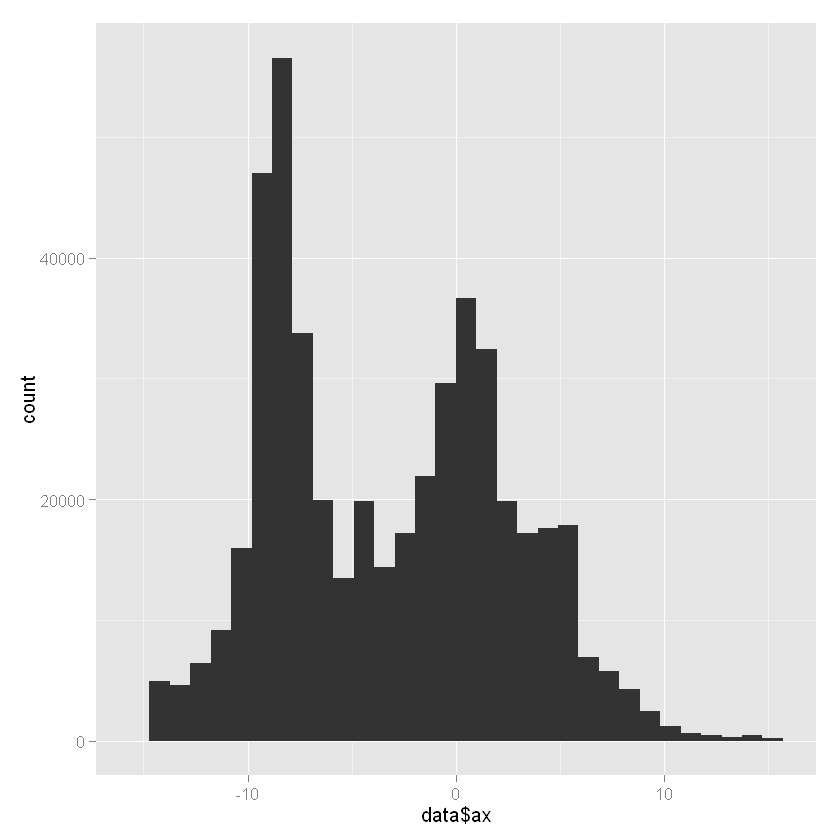

In [16]:
qplot(x= data$ax)

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


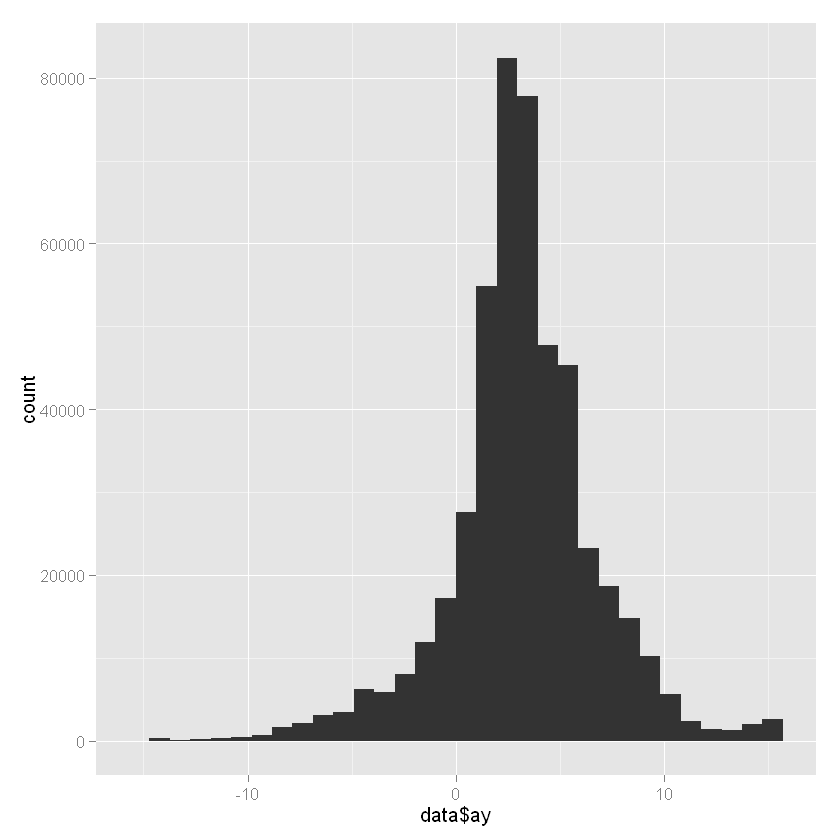

In [17]:
qplot(x= data$ay)

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


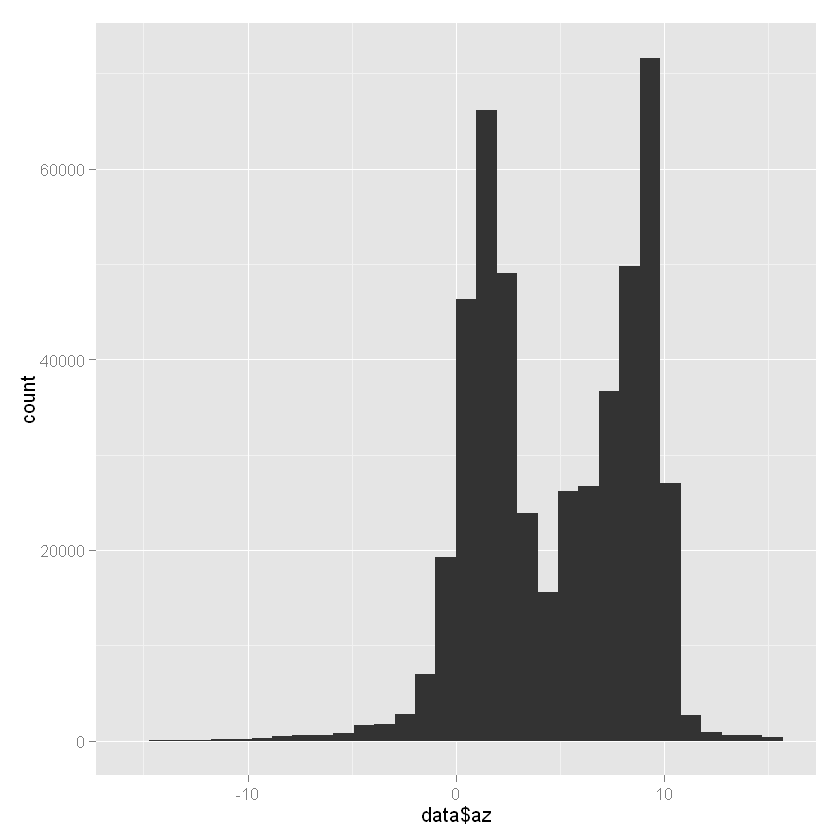

In [18]:
qplot(x= data$az)

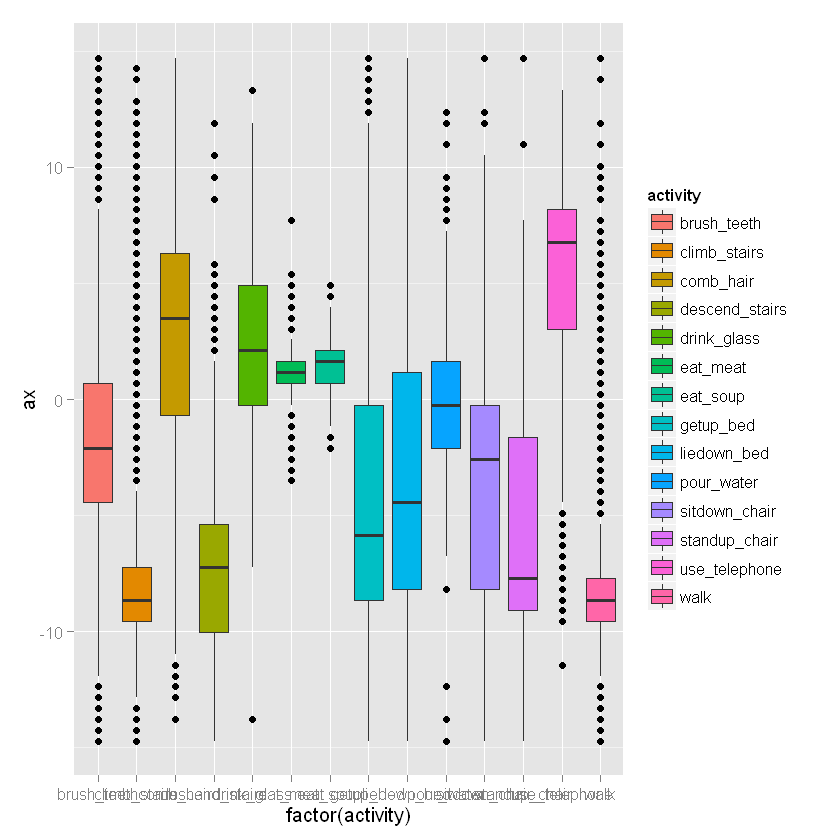

In [29]:
require(ggplot2)
g = ggplot(data, aes(factor(activity),ax))
g+ geom_boxplot(aes(fill= activity))

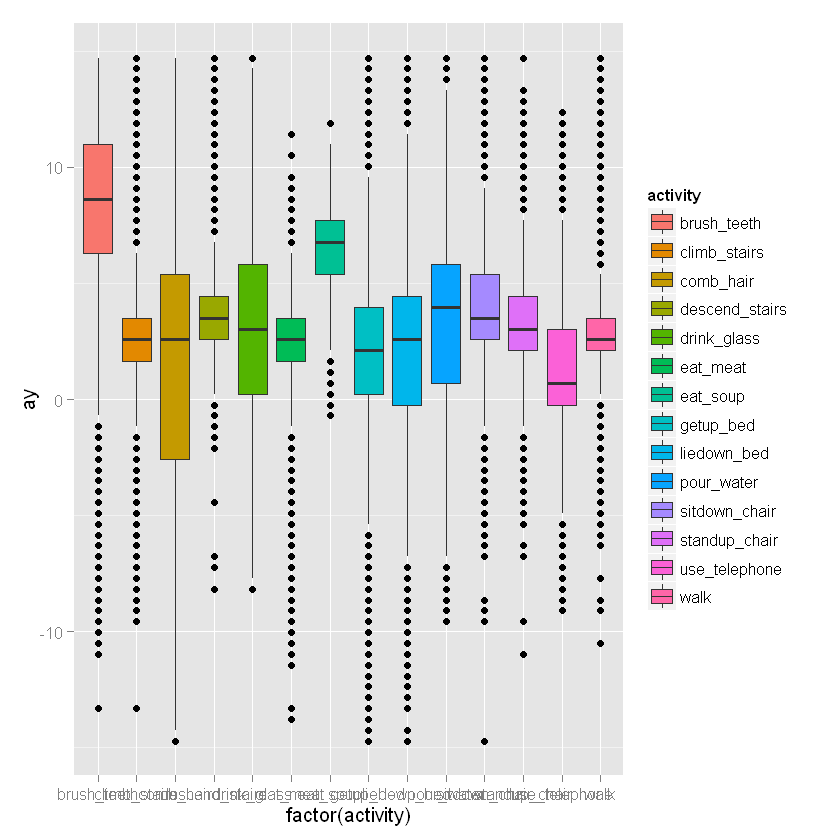

In [30]:
require(ggplot2)
g = ggplot(data, aes(factor(activity),ay))
g+ geom_boxplot(aes(fill= activity)) 

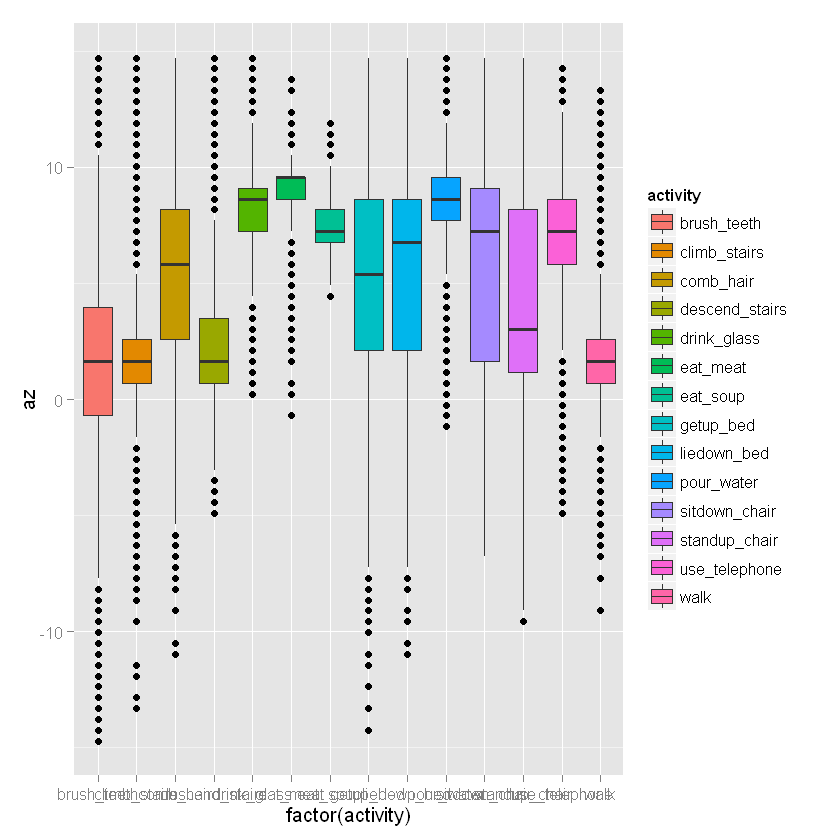

In [31]:
require(ggplot2)
g = ggplot(data, aes(factor(activity),az))
g+ geom_boxplot(aes(fill= activity))

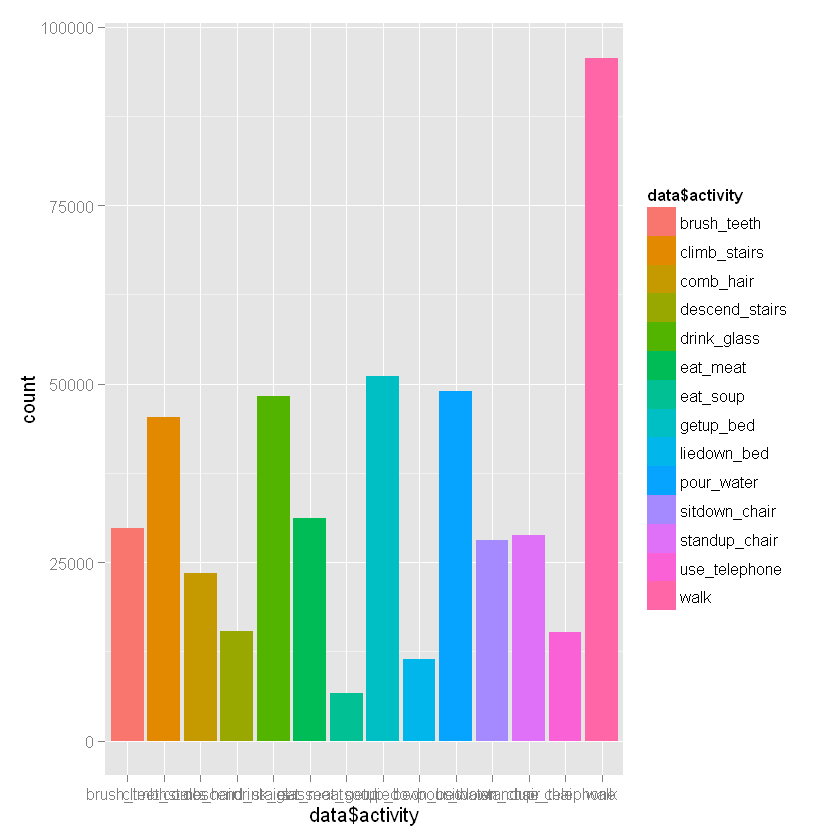

In [34]:
qplot(x=data$activity, fill= data$activity)

## More exploration

Is there any difference for a particular activity?

In [35]:
require(dplyr)

Loading required package: dplyr

Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



In [37]:
data_walking <- filter(data, activity=="walk")

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


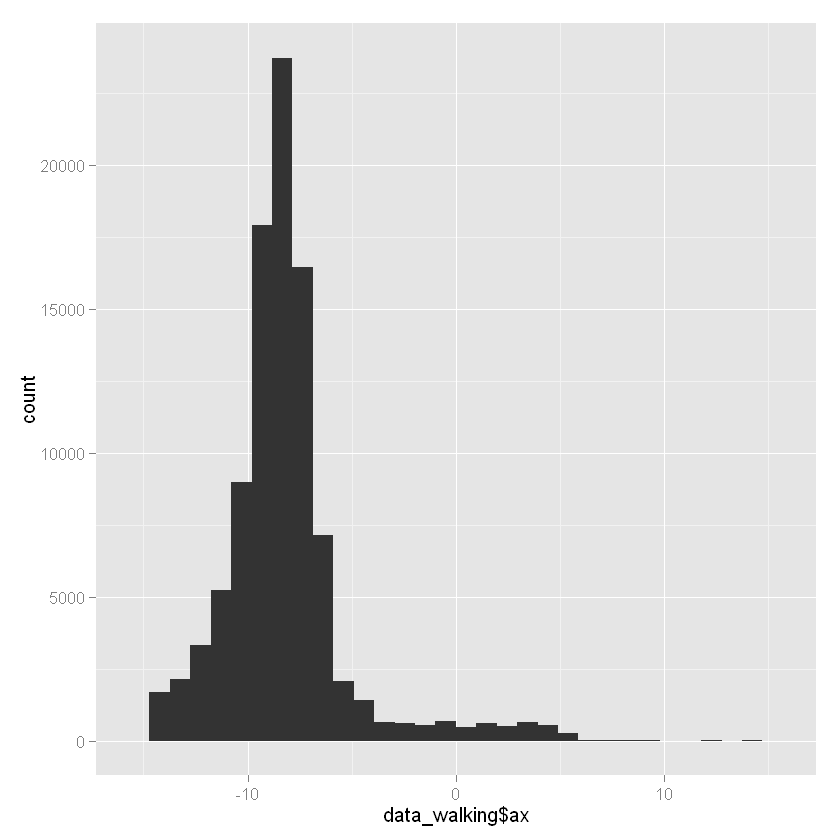

In [38]:
qplot(data_walking$ax)

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


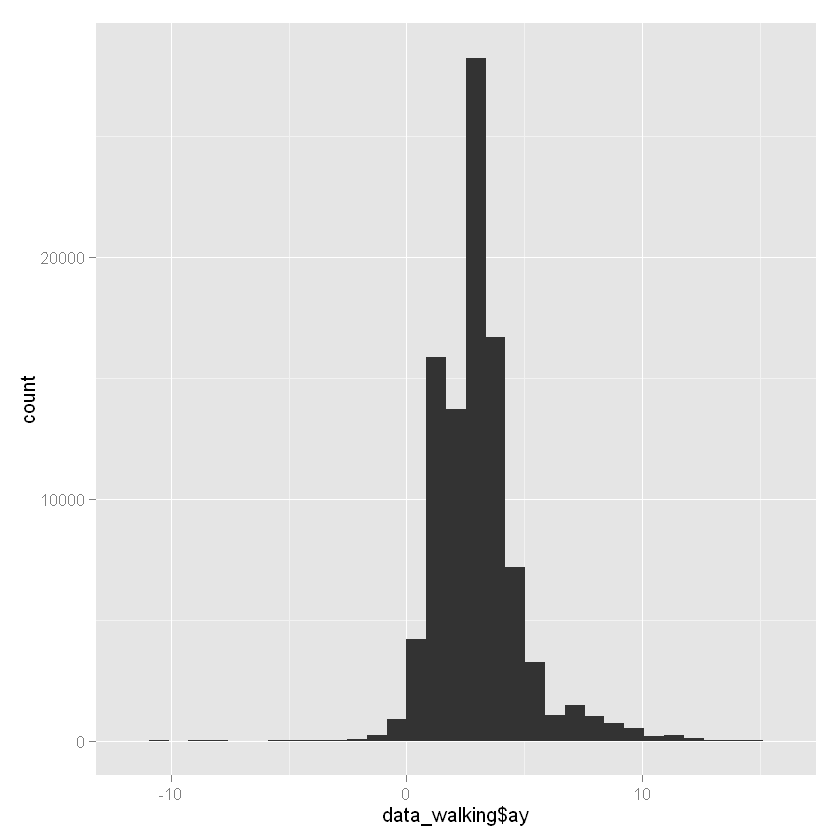

In [39]:
qplot(data_walking$ay)

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


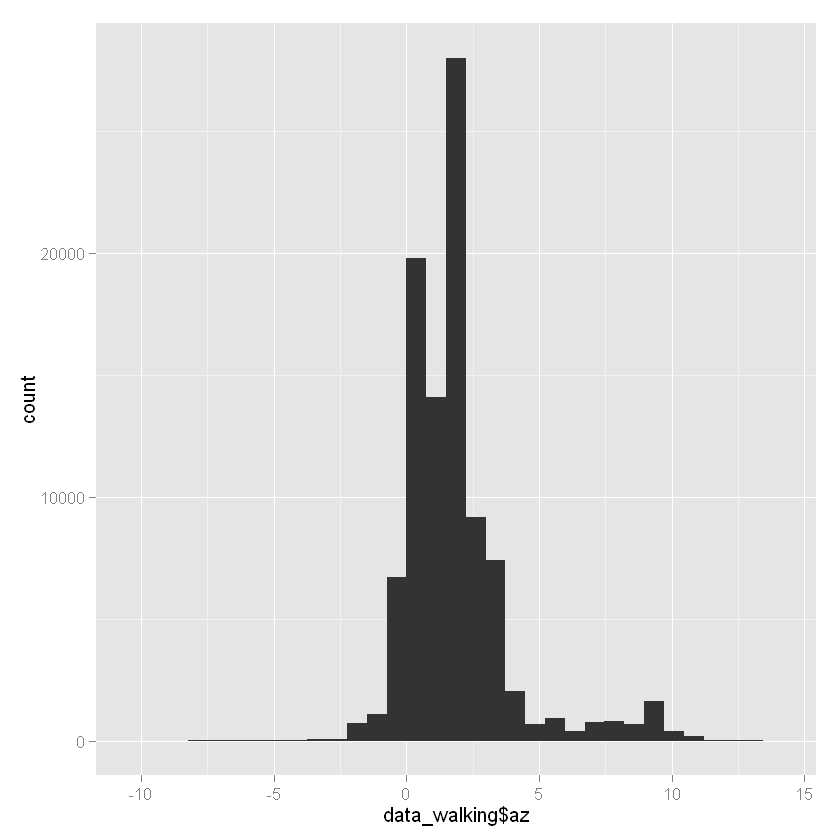

In [40]:
qplot(data_walking$az)

In [41]:
data_brush_teeth <- filter(data, activity=="brush_teeth")

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


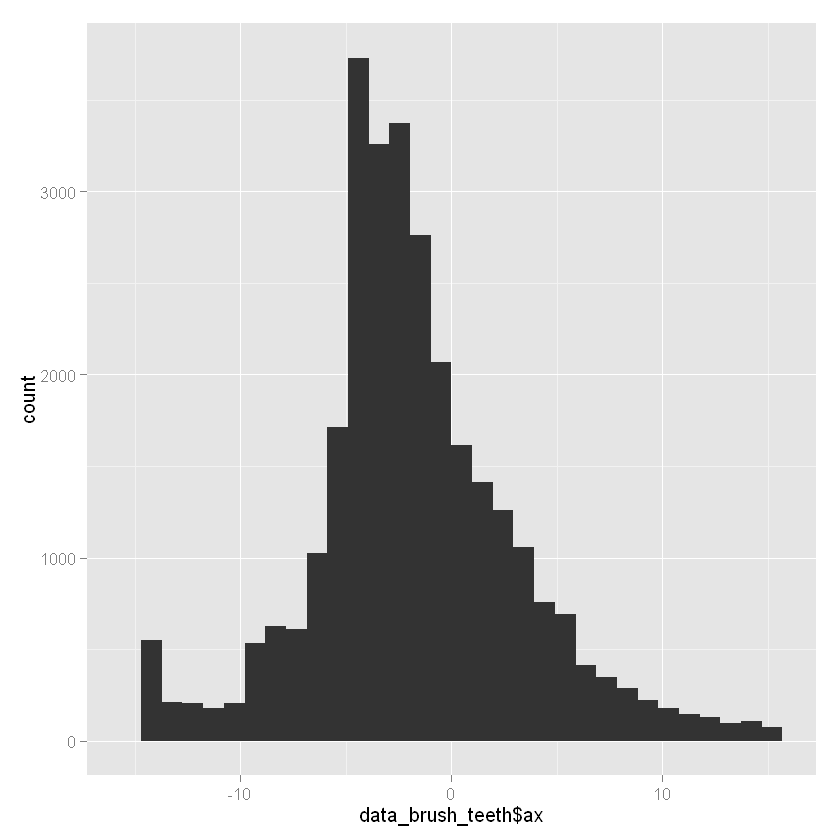

In [42]:
qplot(data_brush_teeth$ax)

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


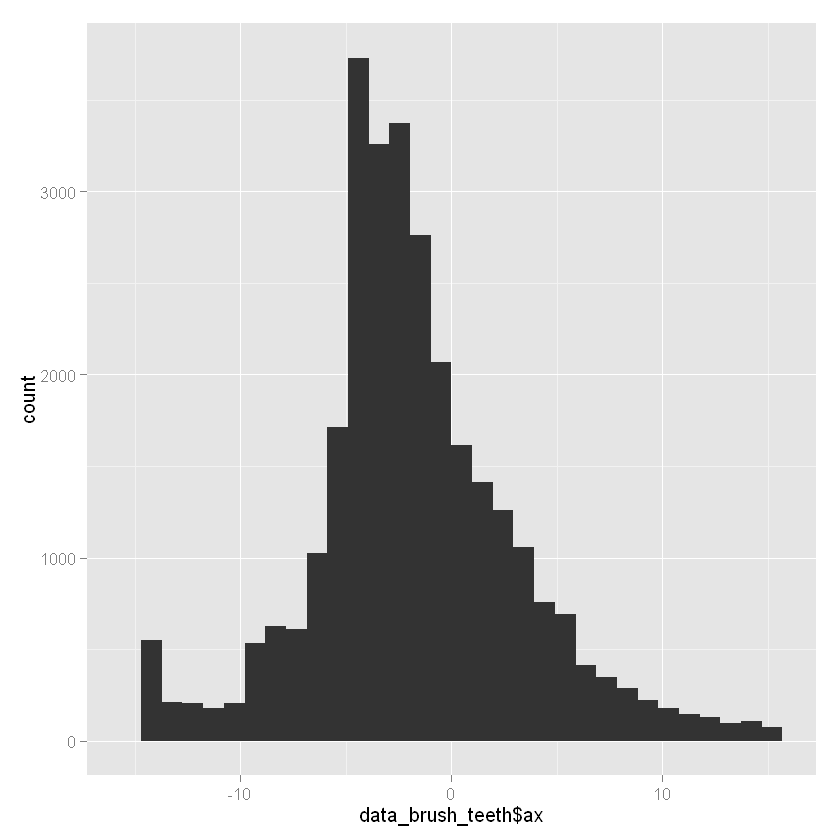

In [43]:
qplot(data_brush_teeth$ax)

stat_bin: binwidth defaulted to range/30. Use 'binwidth = x' to adjust this.


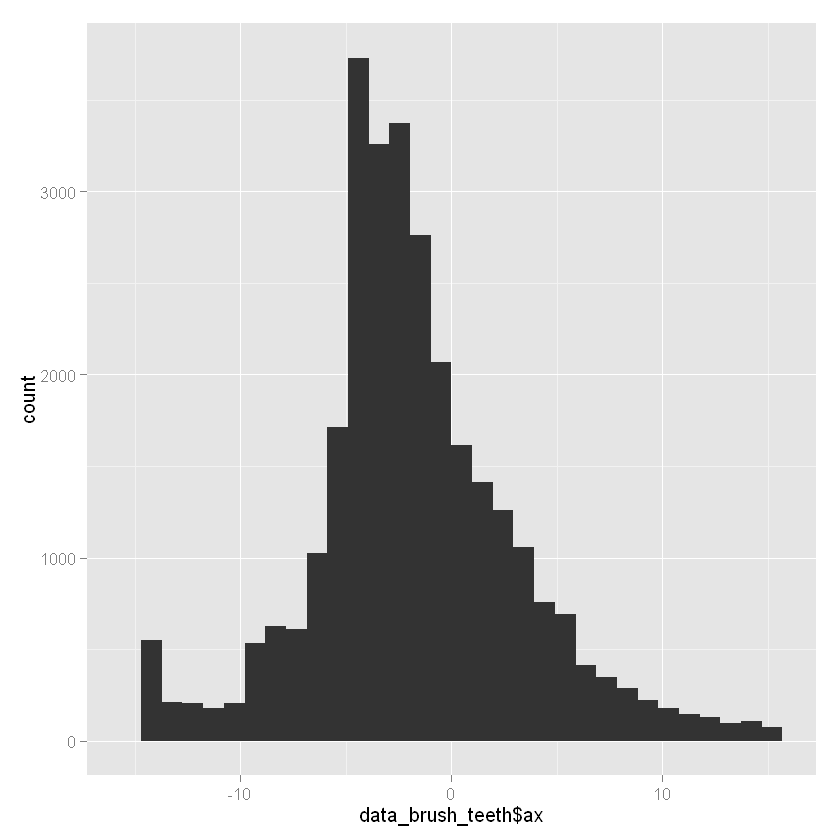

In [44]:
qplot(data_brush_teeth$ax)

#### There seems to be a distinct difference between activities. Discernible even to a naked eye

## TO DO Capturing more features